In [2]:
## Goal of this script:
# Load images from two different folders.
# Convert the .nd2 files into numpy arrays.
# Segment the images using cellpose
# Save the segmentation masks as .tif files in the same folder but with a different name ('segmented_' + original_name)
# Run regionprops on the segmentation masks to get the morphological features of the cells
# in a pandas dataframe, add the morphological features of each image frame to the dataframe
# Always store which folder the images came from in the dataframe, as well as the filename of the image


import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import skimage.io
from skimage import morphology
from skimage.measure import regionprops_table
import nd2reader
from tqdm import tqdm
from skimage.segmentation import clear_border
import napari

#Input:
folder_ko = "/Volumes/imaging.data/mic01-imaging/ForLucien/20x_KD/"
folder_wt = "/Volumes/imaging.data/mic01-imaging/ForLucien/20x_Control/"

#Output:
folder_ko_output = "/Volumes/imaging.data/mic01-imaging/ForVasu/20x_KD/"
folder_wt_output = "/Volumes/imaging.data/mic01-imaging/ForVasu/20x_Control/"

# Load images from two different folders.
filenames_ko = os.listdir(folder_ko)
filenames_wt = os.listdir(folder_wt)

#no nuclear channel
channels = [[0,0]]

df = pd.DataFrame()

# Convert the .nd2 files into numpy arrays.
for filename in tqdm(filenames_ko[:1]):
    if filename.endswith(".nd2"):
        nd2_file = nd2reader.Nd2(os.path.join(folder_ko, filename))
        img = nd2_file[1]

100%|██████████| 1/1 [00:00<00:00, 26.69it/s]


In [3]:
img = skimage.io.imread('/Volumes/imaging.data/mic01-imaging/ForLucien/SIM_data/Exp_2_22_adjusted_SIM.tif')

img_binned = []
for channel in range(img.shape[0]):
    img_binned.append(img[channel].reshape(img[channel].shape[0]//4, 4, img[channel].shape[1]//4, 4).mean(axis=1).mean(axis=2))

img_binned = np.array(img_binned)
img_binned.shape

## Multicore version

In [136]:
from skimage.filters import gabor
import numpy as np
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor

def compute_gabor_response(img, theta, freq):
    return gabor(img, theta=theta, frequency=freq)[0]

def compute_gabor_responses(img, orientations, frequencies):
    responses = []
    thetas = np.arange(0, np.pi, np.pi / orientations)
    
    def process_orientation(theta):
        orientation_responses = [compute_gabor_response(img, theta, freq) for freq in frequencies]
        return orientation_responses
    
    with ThreadPoolExecutor() as executor:
        results = list(tqdm(executor.map(process_orientation, thetas), total=len(thetas)))
    
    return np.array(results)

def compute_gabor_responses_multi_channel(img, orientations, frequencies):
    responses = []
    
    for channel in range(img.shape[0]):
        img_norm = (img[channel] - img[channel].min()) / (img[channel].max() - img[channel].min())
        channel_responses = compute_gabor_responses(img_norm, orientations, frequencies)
        responses.append(channel_responses)
    
    return np.array(responses)

orientations = 80
frequencies = [0.06,0.08]
gabor_responses = compute_gabor_responses_multi_channel(img_binned, orientations, frequencies)
print("Shape of Gabor filter responses array:", gabor_responses.shape)

100%|██████████| 80/80 [00:42<00:00,  1.90it/s]


Shape of Gabor filter responses array: (2, 80, 2, 640, 640)


# Single core

In [842]:
from skimage.filters import gabor
import numpy as np
from tqdm import tqdm

def compute_gabor_responses(img, orientations, frequencies):
    responses = []
    for theta in tqdm(np.arange(0, np.pi, np.pi / orientations)):
        orientation_responses = []
        for freq in frequencies:
            filtered_image, _ = gabor(img, theta=theta, frequency=freq)
            orientation_responses.append(filtered_image)
        responses.append(orientation_responses)
    return np.array(responses)


def compute_gabor_responses_multi_channel(img, orientations, frequencies):
    responses = []
    for channel in range(img.shape[0]):
        img_norm = (img[channel] - img[channel].min()) / (img[channel].max() - img[channel].min())
        channel_responses = compute_gabor_responses(img_norm, orientations, frequencies)
        responses.append(channel_responses)
    return np.array(responses)


# Define parameters
orientations = 20  # number of orientations 
orientations = 40
#frequencies = [0.2, 0.3]  # spatial frequencies for 20x
#frequencies = [0.06,0.08,0.1,0.12]  # spatial frequencies
frequencies = [0.06,0.08]

gabor_responses_channels = compute_gabor_responses_multi_channel(img_binned, orientations, frequencies)
print("Shape of Gabor filter responses array:", gabor_responses_channels.shape)

 25%|██▌       | 10/40 [00:37<01:52,  3.75s/it]


KeyboardInterrupt: 

# Helper functions GABOR filters

In [137]:
def find_max_response_index(gabor_responses):
    # Reshape the responses array to [orientations * frequencies, x, y]
    reshaped_responses = gabor_responses.reshape((-1,) + gabor_responses.shape[-2:])
    # Find the index of the maximum response for each pixel
    max_response_indices = np.argmax(reshaped_responses, axis=0)
    # Reshape the index array to match the input image shape
    max_response_indices = max_response_indices.reshape(gabor_responses.shape[-2:])
    return max_response_indices

def find_max_response(gabor_responses):
    # Reshape the responses array to [orientations * frequencies, x, y]
    reshaped_responses = gabor_responses.reshape((-1,) + gabor_responses.shape[-2:])
    # Find the index of the maximum response for each pixel
    max_response = np.max(reshaped_responses, axis=0)
    # Reshape the index array to match the input image shape
    max_response = max_response.reshape(gabor_responses.shape[-2:])
    return max_response


max_response_indices_c0 = find_max_response_index(gabor_responses[0])
max_response_c0 = find_max_response(gabor_responses[0])

max_response_indices_c1 = find_max_response_index(gabor_responses[1])
max_response_c1 = find_max_response(gabor_responses[1])


## Helper functions to find orientation relative to cell

In [138]:
import matplotlib.pyplot as plt
import numpy as np


#check how close two angles are
def angle_difference(angle1, angle2):
    return np.abs(np.mod(angle1 - angle2 + np.pi, 2 * np.pi) - np.pi)


def calculate_orientation(width, height, centroid_x, centroid_y):
    # Create an empty numpy array with shape (width, height, 2)
    orientation = np.zeros((width, height, 2))
    
    # Calculate the vector to the centroid for each pixel
    for i in range(width):
        for j in range(height):
            dx = centroid_x - i
            dy = centroid_y - j
            orientation[i, j, 0] = dx  # x component of the vector
            orientation[i, j, 1] = dy  # y component of the vector

    #normalize each vector
    for i in range(width):
        for j in range(height):
            norm = np.linalg.norm(orientation[i, j])
            #check for division by zero
            if norm == 0:
                orientation[i, j, 0] = 0
            orientation[i, j, 0] /= norm+0.000001
            orientation[i, j, 1] /= norm+0.000001

    # Create an array to store the orientation angles
    orientation_angle = np.arctan2(orientation[:, :, 0], orientation[:, :, 1])
    # Find angle perpendicular to the orientation angle

    # Keep angles in the range [0, 1*pi]
    orientation_angle = np.mod(orientation_angle, np.pi)
    
    # Create an array to store the perpendicular angles
    orientation_angle_perp = orientation_angle + np.pi / 2
    orientation_angle_perp = np.mod(orientation_angle_perp, 1 * np.pi)  # Keep angles in the range [0, 2*pi]

    return orientation, orientation_angle, orientation_angle_perp

def find_correlation(max_response_indices, orientation):
    response_radians = max_response_indices/np.max(max_response_indices)*np.pi
    correlation_positive = angle_difference(orientation*2,response_radians*2)
    correlation_negative = angle_difference(orientation*2,response_radians*2+np.pi)
    return correlation_positive, correlation_negative


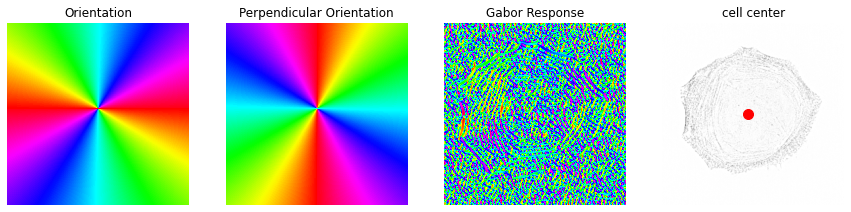

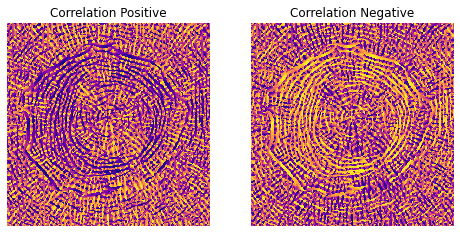

In [176]:
# Example usage
width, height = 640, 640
centroid_x, centroid_y = 300, 320

orientation, orientation_angle, orientation_angle_perp = calculate_orientation(width, height, centroid_x, centroid_y)
correlation_positive_c1, correlation_negative_c1 = find_correlation(max_response_indices_c1, orientation_angle)
correlation_positive_c0, correlation_negative_c0 = find_correlation(max_response_indices_c0, orientation_angle)


#plot next to each other as subplots, with titles
fig, axs = plt.subplots(1, 4, figsize=(15, 5))
axs[0].imshow(orientation_angle, cmap='hsv',interpolation='nearest')
axs[0].set_title('Orientation')
axs[0].axis('off')
axs[1].imshow(orientation_angle_perp, cmap='hsv',interpolation='nearest')
axs[1].set_title('Perpendicular Orientation')
axs[1].axis('off')

#only used for QC
response_radians = max_response_indices_c0/np.max(max_response_indices_c0)*np.pi
axs[2].imshow(response_radians, cmap='hsv')
axs[2].set_title('Gabor Response')
axs[2].axis('off')

#plot the raw image and centroid overlayed
axs[3].imshow(img_binned[0], cmap='gray_r')
axs[3].scatter(centroid_x, centroid_y, c='r', s=100)
axs[3].set_title('cell center')
axs[3].axis('off')

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].imshow(correlation_positive_c0, cmap='plasma',interpolation='nearest')
axs[0].set_title('Correlation Positive')
axs[0].axis('off')
axs[1].imshow(correlation_negative_c0, cmap='plasma',interpolation='nearest')
axs[1].set_title('Correlation Negative')
axs[1].axis('off')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


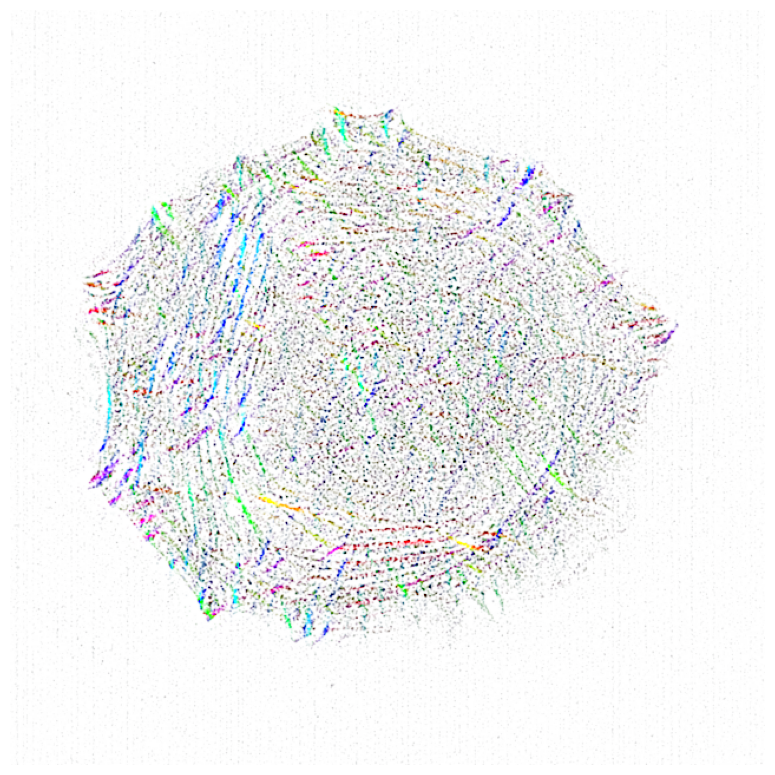

In [177]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb

def hue_intensity_saturation_to_rgb(hue_array, intensity_array, saturation_array=None):
    # Check if saturation_array is provided, if not, assume constant saturation of 1
    if saturation_array is None:
        saturation_array = np.ones_like(hue_array)
    # Normalize hue to range [0, 1]
    hue_array_normalized = (hue_array - np.min(hue_array)) / (np.max(hue_array) - np.min(hue_array))
                                                              
    # Normalize intensity and saturation to range [0, 1], using .9 percentile to remove outliers
    intensity_array_normalized = (intensity_array - np.percentile(intensity_array, 1)) / (np.percentile(intensity_array, 99.5) - np.percentile(intensity_array, 0.5))
    saturation_array_normalized = (saturation_array - np.percentile(saturation_array, 1)) / (np.percentile(saturation_array, 99.5) - np.percentile(saturation_array, 0.5))


    # Convert HSV to RGB
    rgb_image = hsv_to_rgb(np.stack((hue_array_normalized, saturation_array_normalized, intensity_array_normalized), axis=-1))

    # Invert the image
    rgb_image = 1 - rgb_image

    return rgb_image

# Example usage:
hue_array = np.random.uniform(0, 360, size=(100, 100))  # Sample hue values
intensity_array = np.random.uniform(0.5, 1, size=(100, 100))  # Sample intensity values
saturation_array = np.random.uniform(0.01, 0.7, size=(100, 100))  # Sample saturation values

# Create RGB image
rgb_image = hue_intensity_saturation_to_rgb(max_response_indices_c1, img_binned[1], max_response_c1)

# Display the RGB image
plt.figure(figsize=(10, 10),dpi=100)
plt.imshow(rgb_image)
plt.axis('off')
plt.show()


In [179]:
for frame_nb, img in enumerate(img_full):
    img_binned = []
    for channel in range(img.shape[0]):
        img_binned.append(img[channel].reshape(img[channel].shape[0]//4, 4, img[channel].shape[1]//4, 4).mean(axis=1).mean(axis=2))
    img_binned = np.array(img_binned)
    gabor_responses_channels = []
    for channel in range(img_binned.shape[0]):
        img = img_binned[channel]
        img_norm = (img_binned[channel] - img_binned[channel].min()) / (img_binned[channel].max() - img_binned[channel].min())
        gabor_responses = compute_gabor_responses(img_norm, orientations, frequencies)
        gabor_responses_channels.append(gabor_responses)
    gabor_responses_channels = np.array(gabor_responses_channels)
    max_response_indices_c0 = find_max_response_index(gabor_responses_channels[0])
    max_response_c0 = find_max_response(gabor_responses_channels[0])
    max_response_indices_c1 = find_max_response_index(gabor_responses_channels[1])
    max_response_c1 = find_max_response(gabor_responses_channels[1])

    rgb_image_c0 = hue_intensity_saturation_to_rgb(max_response_indices_c0, img_binned[0], max_response_c0)
    rgb_image_c1 = hue_intensity_saturation_to_rgb(max_response_indices_c1, img_binned[1], max_response_c1)

    skimage.io.imsave(f'/Volumes/imaging.data/PertzLab/lhinder/for_vasu/gabor_timelapse_export/gabor_images_c0_{str(frame_nb).zfill(3)}.tif', rgb_image_c0)
    skimage.io.imsave(f'/Volumes/imaging.data/PertzLab/lhinder/for_vasu/gabor_timelapse_export/gabor_images_c1_{str(frame_nb).zfill(3)}.tif', rgb_image_c1)

    plt.imshow(rgb_image_c0)
    plt.show()
    plt.imshow(rgb_image_c1)
    plt.show()
    

NameError: name 'img_full' is not defined

# Helper functions for plotting

In [180]:
import numpy as np

def rgb_to_hue_image(image):
    # Normalize the RGB values to the range [0, 1]
    r_prime = image[:, :, 0] / 255.0
    g_prime = image[:, :, 1] / 255.0
    b_prime = image[:, :, 2] / 255.0

    # Calculate the max and min values
    c_max = np.max(image / 255.0, axis=2)
    c_min = np.min(image / 255.0, axis=2)
    delta = c_max - c_min

    # Calculate the Hue
    hue = np.zeros_like(c_max)

    # Mask for c_max == r_prime
    mask = (c_max == r_prime) & (delta != 0)
    hue[mask] = 60 * (((g_prime[mask] - b_prime[mask]) / delta[mask]) % 6)

    # Mask for c_max == g_prime
    mask = (c_max == g_prime) & (delta != 0)
    hue[mask] = 60 * (((b_prime[mask] - r_prime[mask]) / delta[mask]) + 2)

    # Mask for c_max == b_prime
    mask = (c_max == b_prime) & (delta != 0)
    hue[mask] = 60 * (((r_prime[mask] - g_prime[mask]) / delta[mask]) + 4)

    # Ensure hue is in range [0, 360]
    hue[hue < 0] += 360

    # Normalize hue to the range [0, 1]
    hue /= 360

    return hue
# Example usage:
image = np.random.randint(0, 256, (100, 100, 3), dtype=np.uint8)  # Random RGB image
hue_image = rgb_to_hue_image(image)
print(hue_image)



def rgb_to_hue(r, g, b):
    # Normalize the RGB values to the range [0, 1]
    r_prime, g_prime, b_prime = r / 255.0, g / 255.0, b / 255.0

    # Calculate the max and min values
    c_max = max(r_prime, g_prime, b_prime)
    c_min = min(r_prime, g_prime, b_prime)
    delta = c_max - c_min

    # Calculate the Hue
    if delta == 0:
        hue = 0
    elif c_max == r_prime:
        hue = 60 * (((g_prime - b_prime) / delta) % 6)
    elif c_max == g_prime:
        hue = 60 * (((b_prime - r_prime) / delta) + 2)
    elif c_max == b_prime:
        hue = 60 * (((r_prime - g_prime) / delta) + 4)
    if hue < 0:
        hue += 360
    #normalize to 0-1
    hue = hue/360
    return hue

# Example usage:
r, g, b = 20, 5, 205  # Red color
hue = rgb_to_hue(r, g, b)
print(f"Hue: {hue} degrees")

[[0.46354167 0.36742424 0.90589569 ... 0.20909091 0.71675774 0.38275862]
 [0.39553429 0.12585034 0.50241546 ... 0.0652921  0.69376694 0.88235294]
 [0.84102564 0.62753623 0.28286385 ... 0.17156863 0.55263158 0.15104167]
 ...
 [0.71800948 0.59302326 0.62871287 ... 0.03598485 0.75686275 0.15384615]
 [0.56712963 0.77260459 0.40972222 ... 0.43992248 0.03508772 0.22390572]
 [0.89534884 0.72833333 0.98521505 ... 0.69298246 0.80505952 0.40740741]]
Hue: 0.6791666666666667 degrees


## Color by single color

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.16666666666666652


(-0.5, 639.5, 639.5, -0.5)

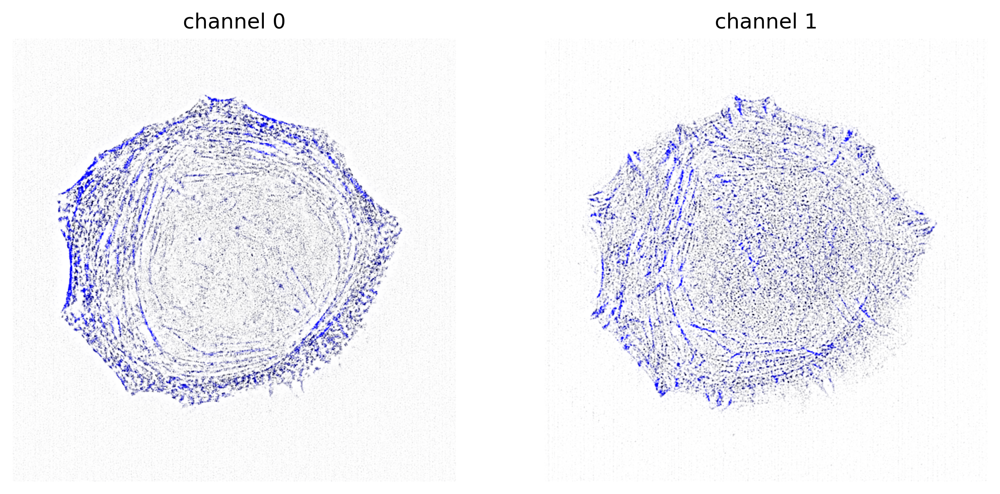

In [181]:
def hue_intensity_saturation_to_rgb(hue, intensity_array, saturation_array=None):
    # Check if saturation_array is provided, if not, assume constant saturation of 1
    hue_array = hue*np.ones_like(intensity_array)           
                                                       
    # Normalize intensity and saturation to range [0, 1], using .9 percentile to remove outliers
    intensity_array_normalized = (intensity_array - np.percentile(intensity_array, 1)) / (np.percentile(intensity_array, 99.5) - np.percentile(intensity_array, 0.5))
    saturation_array_normalized = (saturation_array - np.percentile(saturation_array, 1)) / (np.percentile(saturation_array, 99.5) - np.percentile(saturation_array, 0.5))

    # Convert HSV to RGB
    rgb_image = hsv_to_rgb(np.stack((hue_array, saturation_array_normalized, intensity_array_normalized), axis=-1))

    # Invert the image
    rgb_image = 1 - rgb_image

    return rgb_image

hue = rgb_to_hue(0, 0, 255)
#opposite color in the color wheel
hue = (hue + 0.5) % 1

print(hue)
#rgb_image = hue_intensity_saturation_to_rgb(hue, cross, dot)
rgb_image_c0 = hue_intensity_saturation_to_rgb(hue, img_binned[0], max_response_c0)
rgb_image_c1 = hue_intensity_saturation_to_rgb(hue, img_binned[1], max_response_c1)

#SHOW BOTH IMAGES NEXT TO EACH OTHER
fig, axs = plt.subplots(1,2,figsize=(10,10),dpi = 300)
axs[0].imshow(rgb_image_c0)
axs[0].set_title('channel 0')
axs[0].axis('off')
axs[1].imshow(rgb_image_c1)
axs[1].set_title('channel 1')
axs[1].axis('off')

# Color by relative angle

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


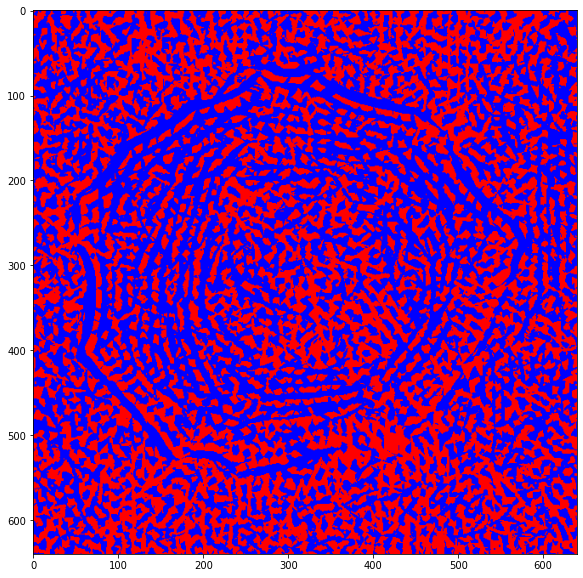

In [148]:

def overlay_multiple_colors(images, colors):
    # Ensure the number of images matches the number of colors
    # TODO doesnt work with all colors yet!!
    if len(images) != len(colors):
        raise ValueError("The number of images must match the number of colors.")
    
    # Initialize the combined image as a white background
    height, width = images[0].shape
    combined_image = np.ones((height, width, 3))

    # Process each image and color
    for image, color in zip(images, colors):
        # Convert color to RGB
        color_rgb = np.array(mcolors.to_rgb(color))
        #find the color complement
        color_rgb = 1 - color_rgb

        # Create an RGB image with the specified color
        image_rgb = np.zeros((height, width, 3))
        for i in range(3):
            image_rgb[:, :, i] = image * color_rgb[i]
        # Combine using subtractive mixing
        image_rgb = image_rgb/len(images)
        image_rgb = 1 - image_rgb
        # Combine the images using subtractive mixing
        combined_image *= image_rgb

    # Ensure the resulting image is within the [0, 1] range
    #combined_image = np.clip(combined_image, 0, 1)
    return combined_image



# Example usage:
images = [c0_col0, c0_col1]
colors = ['blue', 'red']
combined_image = overlay_multiple_colors(images, colors)


# Display the combined image
plt.figure(figsize=(10, 10))
plt.imshow(combined_image)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 639.5, 639.5, -0.5)

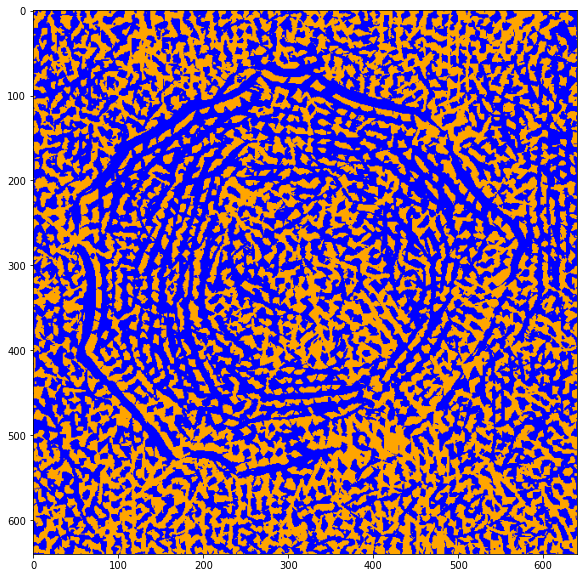

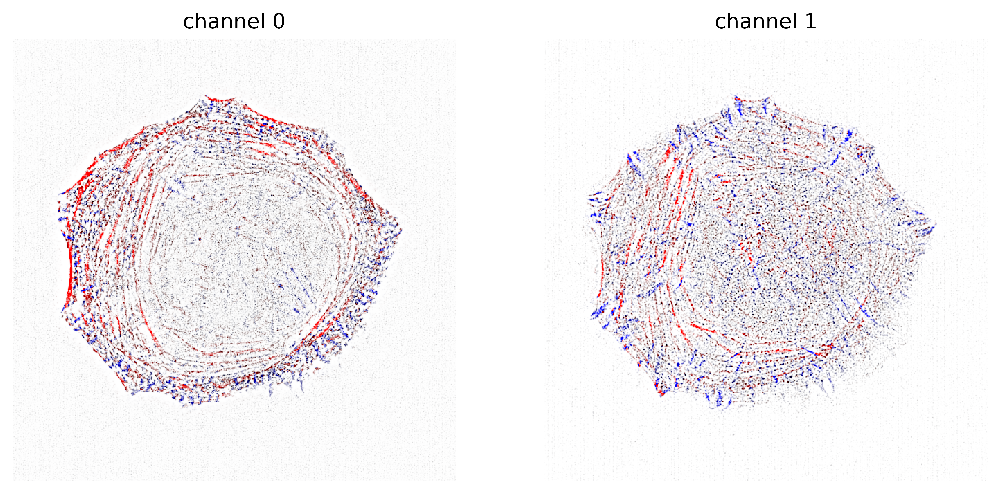

In [186]:
import numpy as np
import matplotlib.colors as mcolors

def overlay_multiple_colors(images, colors):
    # Ensure the number of images matches the number of colors
    if len(images) != len(colors):
        raise ValueError("The number of images must match the number of colors.")
    
    # Initialize the combined image as a black background
    height, width = images[0].shape
    combined_image = np.zeros((height, width, 3))

    # Process each image and color
    for image, color in zip(images, colors):
        # Convert color to RGB
        color_rgb = np.array(mcolors.to_rgb(color))
        
        # Create an RGB image with the specified color
        image_rgb = np.zeros((height, width, 3))
        for i in range(3):
            image_rgb[:, :, i] = image * color_rgb[i]
        
        # Combine the images using additive mixing
        combined_image += image_rgb

    # Normalize the combined image to ensure no values exceed 1
    max_value = np.max(combined_image)
    if max_value > 1:
        combined_image /= max_value
    
    # Ensure the resulting image is within the [0, 1] range
    combined_image = np.clip(combined_image, 0, 1)
    return combined_image



def calculate_col_arrays(correlation_positive, correlation_negative):
    #return c0 and c1 arrays
    mask = correlation_positive <= correlation_negative
    col_0_array = np.ones_like(correlation_positive)*255
    col_0_array[mask] = 0
    col_1_array = np.ones_like(correlation_positive)*255
    col_1_array[~mask] = 0
    return col_0_array, col_1_array


c0_col0, c0_col1 = calculate_col_arrays(correlation_positive_c0, correlation_negative_c0)
c1_col0, c1_col1 = calculate_col_arrays(correlation_positive_c1, correlation_negative_c1) 


# Example usage:
# Assuming c0_col0 and c0_col1 are numpy arrays representing grayscale images
colors = ['blue', 'red']  # Now works with 'pink' properly
images = [c0_col0, c0_col1]
c0_rgb = overlay_multiple_colors(images, colors)
images = [c1_col0, c1_col1]
c1_rgb = overlay_multiple_colors(images, colors)

# Display the combined image for QC
#plt.figure(figsize=(10, 10))
#plt.imshow(combined_image)

rgb_image_c0 = hue_intensity_saturation_to_rgb(1-c0_rgb, img_binned[0], max_response_c0)
rgb_image_c1 = hue_intensity_saturation_to_rgb(1-c1_rgb, img_binned[1], max_response_c1)

#SHOW BOTH IMAGES NEXT TO EACH OTHER
fig, axs = plt.subplots(1,2,figsize=(10,10),dpi = 600)
axs[0].imshow(rgb_image_c0)
axs[0].set_title('channel 0')
axs[0].axis('off')
axs[1].imshow(rgb_image_c1)
axs[1].set_title('channel 1')
axs[1].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


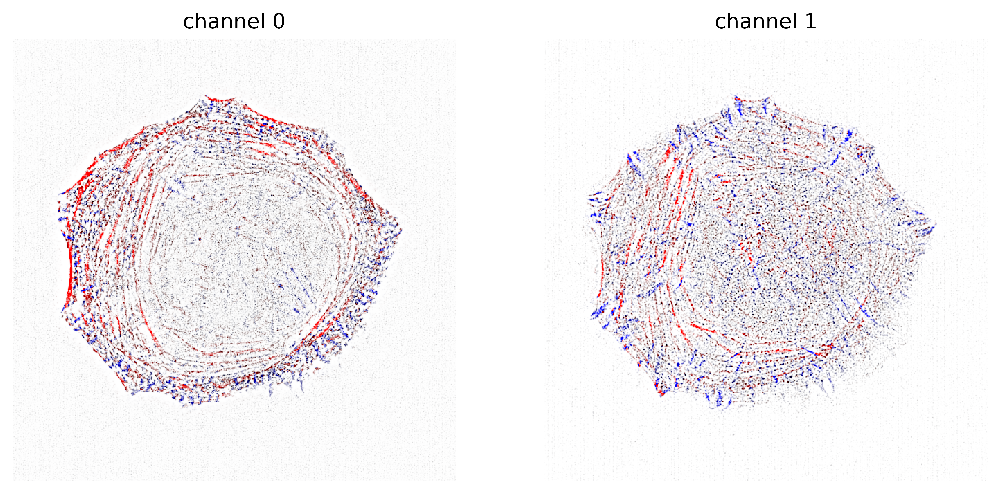

In [199]:
import skimage.io as io
def hue_intensity_saturation_to_rgb(rgb_array, intensity_array, saturation_array=None):                                                       
    # Normalize intensity and saturation to range [0, 1], using .9 percentile to remove outliers

    #convert rgb to hue
    hue_array = rgb_to_hue_image(rgb_array)
    intensity_array_normalized = (intensity_array - np.percentile(intensity_array, 1)) / (np.percentile(intensity_array, 99.5) - np.percentile(intensity_array, 0.5))
    saturation_array_normalized = (saturation_array - np.percentile(saturation_array, 1)) / (np.percentile(saturation_array, 99.5) - np.percentile(saturation_array, 0.5))
    # Convert HSV to RGB
    rgb_image = hsv_to_rgb(np.stack((hue_array, saturation_array_normalized, intensity_array_normalized), axis=-1))

    # Invert the image
    rgb_image = 1 - rgb_image
    return rgb_image


def convert_to_16bit_tif(array,channel_name,frame_nb):
    #clip to 0-1
    array = np.clip(array, 0, 1)
    # Convert the array to 16-bit
    array_16bit = (array * 65535).astype(np.uint16)
    io.imsave(f'{channel_name}_{str(frame_nb).zfill(3)}.tif', array_16bit)

colors = ['blue', 'red']
c0_RGB = overlay_multiple_colors([c0_col0,c0_col1], colors)
c1_RGB = overlay_multiple_colors([c1_col0,c1_col1], colors)

rgb_image_c0 = hue_intensity_saturation_to_rgb(1-c0_RGB, img_binned[0], max_response_c0)
rgb_image_c1 = hue_intensity_saturation_to_rgb(1-c1_RGB, img_binned[1], max_response_c1)

#SHOW BOTH IMAGES NEXT TO EACH OTHER
fig, axs = plt.subplots(1,2,figsize=(10,10),dpi = 600)
axs[0].imshow(rgb_image_c0)
axs[0].set_title('channel 0')
axs[0].axis('off')
axs[1].imshow(rgb_image_c1)
axs[1].set_title('channel 1')
axs[1].axis('off')

frame_nb = 0
convert_to_16bit_tif(rgb_image_c0,'channel_0',frame_nb)
convert_to_16bit_tif(rgb_image_c1,'channel_1',frame_nb)

# Loop over all frames

In [200]:
img_full = skimage.io.imread('/Volumes/imaging.data/mic01-imaging/ForLucien/SIM_data/TimeSeries_Exp_2_22_adjusted_SIM.tif')
img_full.shape

(50, 2, 2560, 2560)

In [ ]:
## combine everything into a function
#input is the image, output is the rgb_image, saved as a .tif file for both channels
colors = ['blue', 'red']


for frame_nb, img in enumerate(img_full):
    print(frame_nb)

    img_binned = []
    for channel in range(img.shape[0]):
        img_binned.append(img[channel].reshape(img[channel].shape[0]//4, 4, img[channel].shape[1]//4, 4).mean(axis=1).mean(axis=2))
    img_binned = np.array(img_binned)
    gabor_responses = compute_gabor_responses_multi_channel(img_binned, orientations, frequencies)
    max_response_indices_c0 = find_max_response_index(gabor_responses[0])
    max_response_c0 = find_max_response(gabor_responses[0])
    max_response_indices_c1 = find_max_response_index(gabor_responses[1])
    max_response_c1 = find_max_response(gabor_responses[1])

    # calculate the orientation relative to the centroid
    orientation, orientation_angle, orientation_angle_perp = calculate_orientation(width, height, centroid_x, centroid_y)
    correlation_positive_c1, correlation_negative_c1 = find_correlation(max_response_indices_c1, orientation_angle)
    correlation_positive_c0, correlation_negative_c0 = find_correlation(max_response_indices_c0, orientation_angle)

    c0_col0, c0_col1 = calculate_col_arrays(correlation_positive_c0, correlation_negative_c0)
    c1_col0, c1_col1 = calculate_col_arrays(correlation_positive_c1, correlation_negative_c1)

    c0_RGB = overlay_multiple_colors([c0_col0,c0_col1], colors)
    c1_RGB = overlay_multiple_colors([c1_col0,c1_col1], colors)

    rgb_image_c0 = hue_intensity_saturation_to_rgb(1-c0_RGB, img_binned[0], max_response_c0)
    rgb_image_c1 = hue_intensity_saturation_to_rgb(1-c1_RGB, img_binned[1], max_response_c1)
    plt.imshow(rgb_image_c0)
    plt.show()
    plt.imshow(rgb_image_c1)
    plt.show()

    convert_to_16bit_tif(rgb_image_c0,'channel_0',frame_nb)
    convert_to_16bit_tif(rgb_image_c1,'channel_1',frame_nb)
